In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

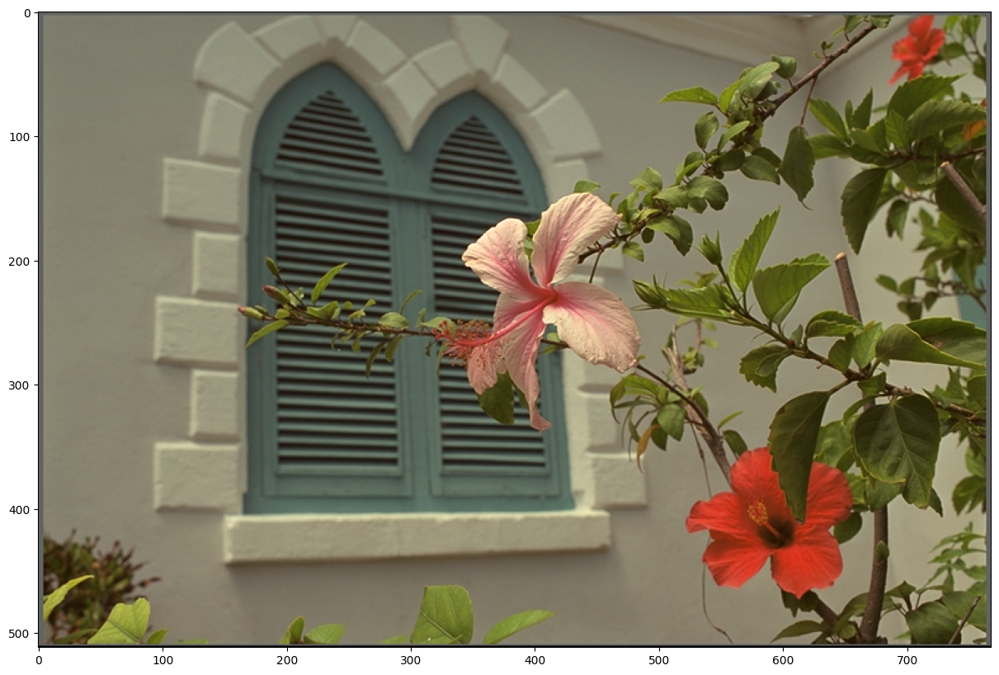

In [3]:
img = cv2.imread('data/kodim07.png')
img_2 = cv2.imread('data/kodim01.png')

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

plt.imshow(img)

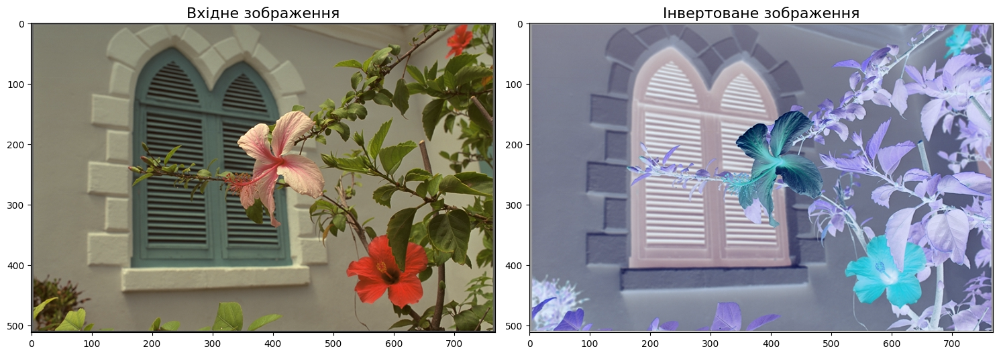

In [4]:
im_inverted = cv2.bitwise_not(img)

plt.subplot(121)
plt.imshow(img)
plt.title('Вхідне зображення', fontsize=16)

plt.subplot(122)
plt.imshow(im_inverted)
plt.title('Інвертоване зображення', fontsize=16)

plt.tight_layout()
plt.show()

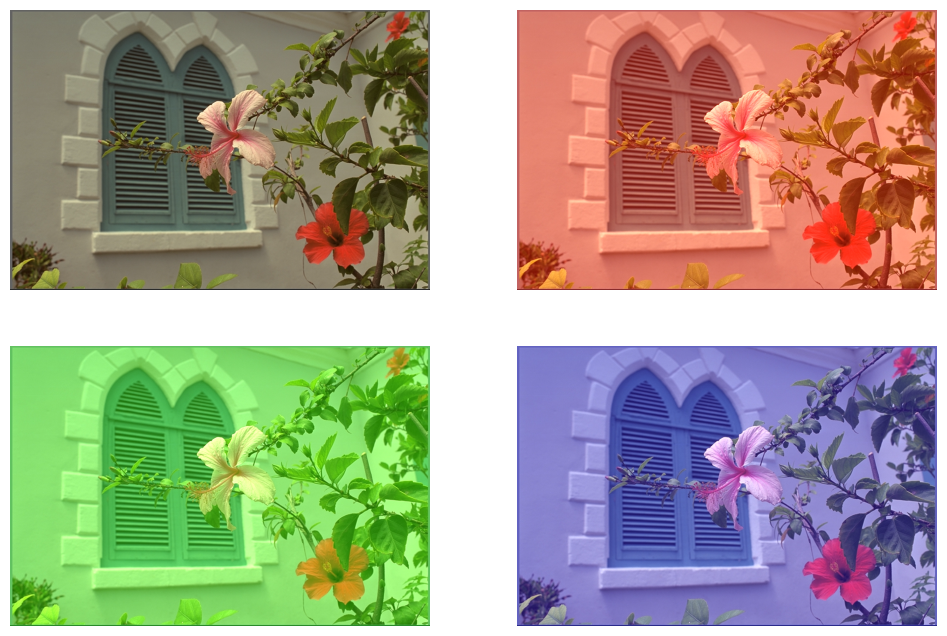

In [5]:
c = 95
img_list = []
for i in range(3):
    img_modified = img.copy()
    img_modified[:, :, i] = cv2.add(img_modified[:, :, i], c)
    img_list.append(img_modified)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(img)
axes[0, 0].axis('off')

axes[0, 1].imshow(img_list[0])
axes[0, 1].axis('off')

axes[1, 0].imshow(img_list[1])
axes[1, 0].axis('off')

axes[1, 1].imshow(img_list[2])
axes[1, 1].axis('off')

plt.show()

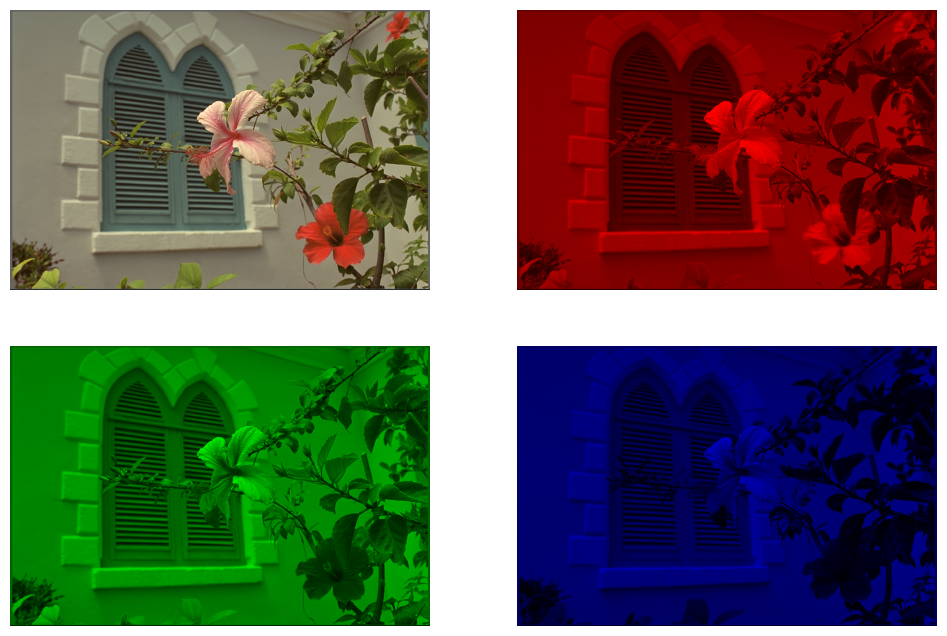

In [6]:
img_list = []
for i in range(3):
    channel_img = np.zeros_like(img)
    channel_img[:, :, i] = img[:, :, i]
    img_list.append(channel_img)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(img)
axes[0, 0].axis('off')

axes[0, 1].imshow(img_list[0])
axes[0, 1].axis('off')

axes[1, 0].imshow(img_list[1])
axes[1, 0].axis('off')

axes[1, 1].imshow(img_list[2])
axes[1, 1].axis('off')

plt.show()

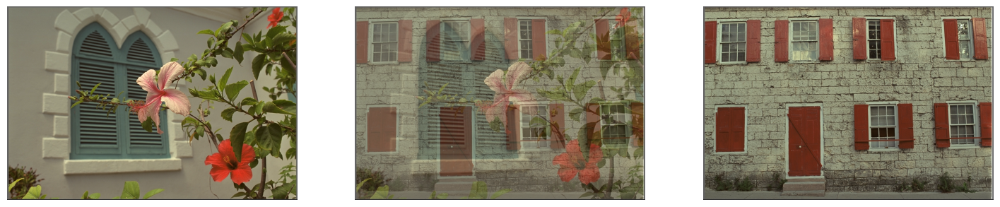

In [7]:
height, width, _ = img.shape

img2_resized = cv2.resize(img_2, (width, height))
    
alpha = 0.5 

blended = alpha * img + (1 - alpha) * img_2
blended_img = blended.astype(np.uint8)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(img)
axes[0].axis('off')

axes[1].imshow(blended_img)
axes[1].axis('off')

axes[2].imshow(img2_resized)
axes[2].axis('off')

plt.show()

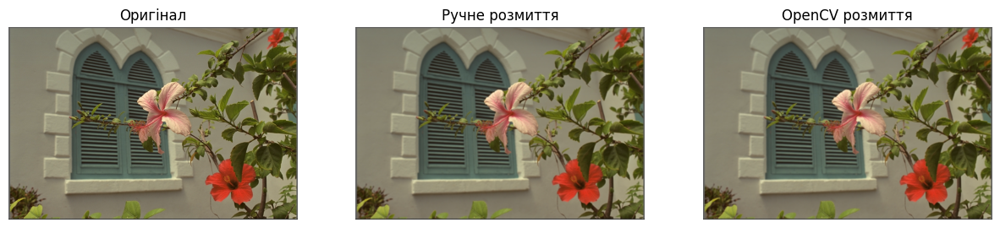

In [16]:
gauss_blur_mat = np.array([
    [0.000789, 0.006581, 0.013347, 0.006581, 0.000789],
    [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
    [0.013347, 0.111345, 0.225821, 0.111345, 0.013347],
    [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
    [0.000789, 0.006581, 0.013347, 0.006581, 0.000789]
], dtype=np.float32)

pad_blur = 2

padded_blur = np.pad(img, pad_width=((pad_blur, pad_blur), (pad_blur, pad_blur), (0, 0)), mode='edge')
manual_blur_raw = np.zeros_like(img, dtype=np.float32)

kernel_3d = gauss_blur_mat[:, :, np.newaxis]

img_h, img_w, _ = img.shape

for y in range(img_h):
    for x in range(img_w):
        region = padded_blur[y:y+5, x:x+5]
        manual_blur_raw[y, x] = np.sum(region * kernel_3d, axis=(0, 1))

manual_blur = np.clip(manual_blur_raw, 0, 255).astype(np.uint8)

cv2_blur = cv2.filter2D(img, -1, gauss_blur_mat)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img); axes[0].set_title('Оригінал')
axes[1].imshow(manual_blur); axes[1].set_title('Ручне розмиття')
axes[2].imshow(cv2_blur); axes[2].set_title('OpenCV розмиття')

for ax in axes: ax.axis('off')
plt.show()

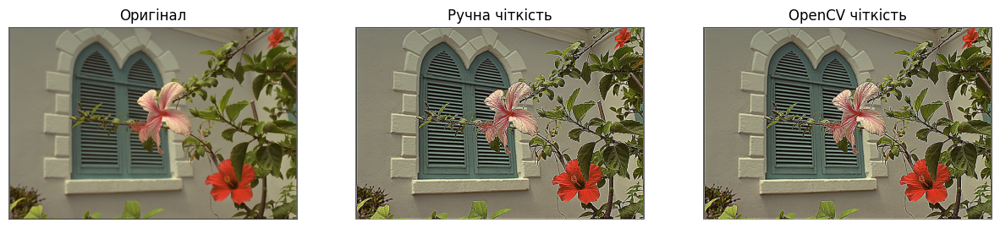

In [17]:
sharpen_mat = np.array([
    [-1, -1, -1],
    [-1,  9, -1],
    [-1, -1, -1]
], dtype=np.float32)

pad_sharp = 1

padded_sharp = np.pad(img, pad_width=((pad_sharp, pad_sharp), (pad_sharp, pad_sharp), (0, 0)), mode='edge')
manual_sharpen_raw = np.zeros_like(img, dtype=np.float32)

kernel_3d_sharp = sharpen_mat[:, :, np.newaxis]

img_h, img_w, _ = img.shape

for y in range(img_h):
    for x in range(img_w):
        region = padded_sharp[y:y+3, x:x+3]
        manual_sharpen_raw[y, x] = np.sum(region * kernel_3d_sharp, axis=(0, 1))

manual_sharpen = np.clip(manual_sharpen_raw, 0, 255).astype(np.uint8)

cv2_sharpen = cv2.filter2D(img, -1, sharpen_mat)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img); axes[0].set_title('Оригінал')
axes[1].imshow(manual_sharpen); axes[1].set_title('Ручна чіткість')
axes[2].imshow(cv2_sharpen); axes[2].set_title('OpenCV чіткість')

for ax in axes: ax.axis('off')
plt.show()

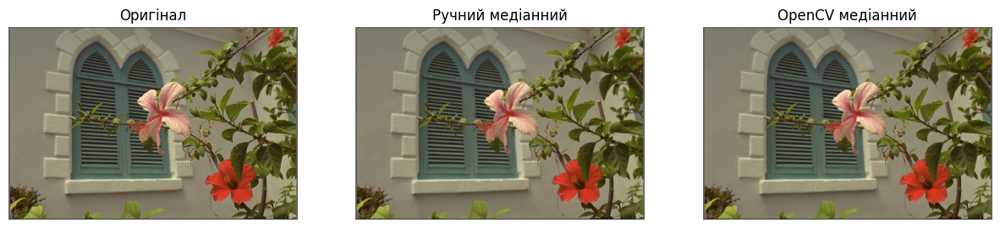

In [19]:
k_size = 3
pad_med = k_size // 2

padded_med = np.pad(img, pad_width=((pad_med, pad_med), (pad_med, pad_med), (0, 0)), mode='edge')
manual_median_raw = np.zeros_like(img, dtype=np.uint8)

img_h, img_w, _ = img.shape

for y in range(img_h):
    for x in range(img_w):
        region = padded_med[y:y+k_size, x:x+k_size]
        
        median_values = np.median(region.reshape(-1, 3), axis=0)
        manual_median_raw[y, x] = median_values

manual_median = manual_median_raw

cv2_median = cv2.medianBlur(img, k_size)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img)
axes[0].set_title('Оригінал')

axes[1].imshow(manual_median)
axes[1].set_title(f'Ручний медіанний')

axes[2].imshow(cv2_median)
axes[2].set_title('OpenCV медіанний')

for ax in axes: ax.axis('off')
plt.show()

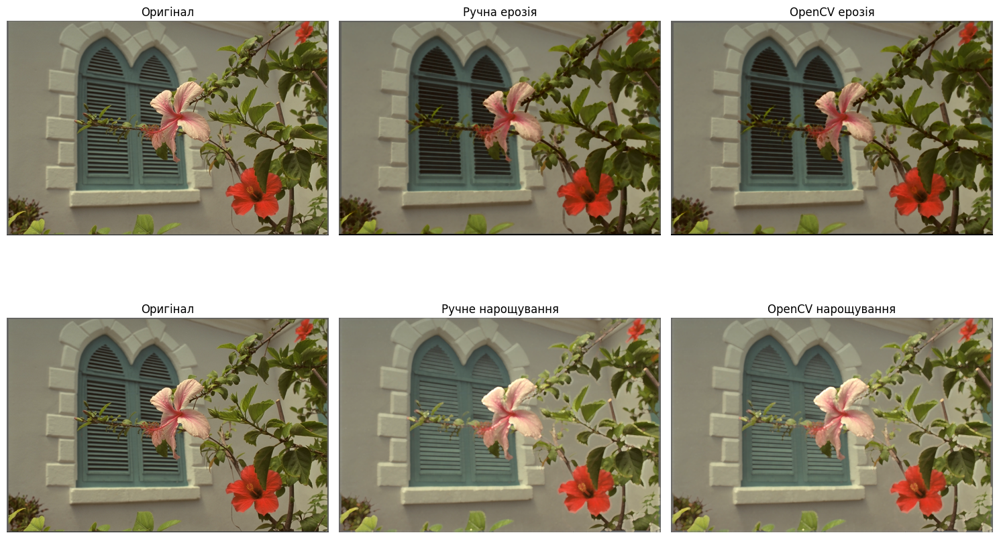

In [22]:
morph_mat = np.array([
    [0, 0, 1, 0, 0],
    [0, 1, 1, 1, 0],
    [1, 1, 1, 1, 1],
    [0, 1, 1, 1, 0],
    [0, 0, 1, 0, 0]
], dtype=np.uint8)

pad_morph = 2
img_h, img_w, _ = img.shape

padded_erosion = np.pad(img, pad_width=((pad_morph, pad_morph), (pad_morph, pad_morph), (0, 0)), mode='constant', constant_values=255)
padded_dilation = np.pad(img, pad_width=((pad_morph, pad_morph), (pad_morph, pad_morph), (0, 0)), mode='constant', constant_values=0)

manual_erosion = np.zeros_like(img, dtype=np.uint8)
manual_dilation = np.zeros_like(img, dtype=np.uint8)

ker_indices = np.where(morph_mat == 1)

for y in range(img_h):
    for x in range(img_w):
        region_ero = padded_erosion[y:y+5, x:x+5]
        region_dil = padded_dilation[y:y+5, x:x+5]
        
        manual_erosion[y, x] = np.min(region_ero[ker_indices], axis=0)
        manual_dilation[y, x] = np.max(region_dil[ker_indices], axis=0)

cv2_erosion = cv2.erode(img, morph_mat, iterations=1)
cv2_dilation = cv2.dilate(img, morph_mat, iterations=1)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))


axes[0, 0].imshow(img); 
axes[0, 0].set_title('Оригінал')
axes[0, 1].imshow(manual_erosion); 
axes[0, 1].set_title('Ручна ерозія')
axes[0, 2].imshow(cv2_erosion);
axes[0, 2].set_title('OpenCV ерозія')

axes[1, 0].imshow(img); 
axes[1, 0].set_title('Оригінал')
axes[1, 1].imshow(manual_dilation); 
axes[1, 1].set_title('Ручне нарощування')
axes[1, 2].imshow(cv2_dilation); 
axes[1, 2].set_title('OpenCV нарощування')

for ax in axes.flat: 
    ax.axis('off')
    
plt.tight_layout()
plt.show()

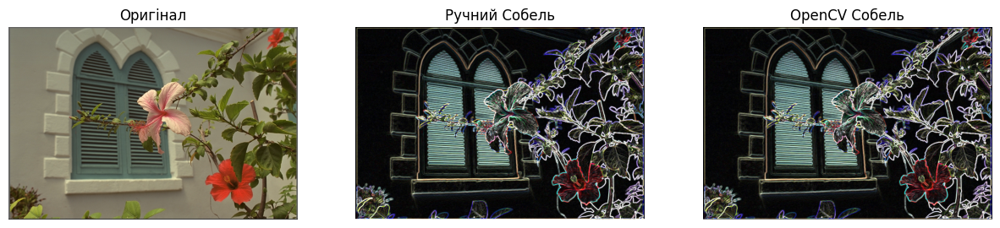

In [23]:
sobel_x = np.array([
    [-1,  0,  1],
    [-2,  0,  2],
    [-1,  0,  1]
], dtype=np.float32)

sobel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)

pad_sobel = 1

padded_sobel = np.pad(img, pad_width=((pad_sobel, pad_sobel), (pad_sobel, pad_sobel), (0, 0)), mode='edge')
grad_x_raw = np.zeros_like(img, dtype=np.float32)
grad_y_raw = np.zeros_like(img, dtype=np.float32)

kernel_3d_sx = sobel_x[:, :, np.newaxis]
kernel_3d_sy = sobel_y[:, :, np.newaxis]

img_h, img_w, _ = img.shape

for y in range(img_h):
    for x in range(img_w):
        region = padded_sobel[y:y+3, x:x+3]
        grad_x_raw[y, x] = np.sum(region * kernel_3d_sx, axis=(0, 1))
        grad_y_raw[y, x] = np.sum(region * kernel_3d_sy, axis=(0, 1))

manual_sobel_raw = np.sqrt(grad_x_raw**2 + grad_y_raw**2)
manual_sobel = np.clip(manual_sobel_raw, 0, 255).astype(np.uint8)

cv2_sobel_x = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
cv2_sobel_y = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
cv2_sobel = np.clip(np.sqrt(cv2_sobel_x**2 + cv2_sobel_y**2), 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img); axes[0].set_title('Оригінал')
axes[1].imshow(manual_sobel); axes[1].set_title('Ручний Собель')
axes[2].imshow(cv2_sobel); axes[2].set_title('OpenCV Собель')

for ax in axes: ax.axis('off')
plt.show()

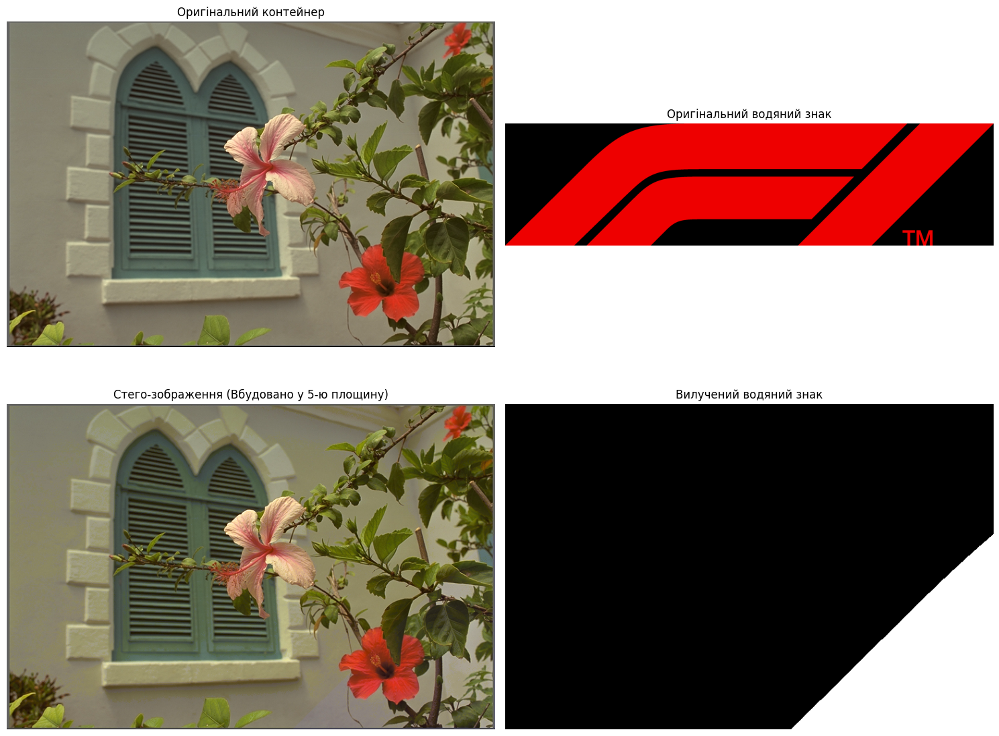

In [32]:
watermark_img = cv2.imread('data/f1.png')    
watermark_img = cv2.cvtColor(watermark_img, cv2.COLOR_BGR2RGB)

def embed_and_extract_watermark(cover, watermark, plane_num):
    bit_idx = plane_num - 1 
    
    wm_gray = cv2.cvtColor(watermark, cv2.COLOR_RGB2GRAY)
    
    _, wm_bin = cv2.threshold(wm_gray, 1, 1, cv2.THRESH_BINARY)
    
    h_c, w_c = cover.shape[:2]
    h_w, w_w = wm_bin.shape[:2]
    
    tiles_y = (h_c // h_w) + 1
    tiles_x = (w_c // w_w) + 1
    wm_tiled = np.tile(wm_bin, (tiles_y, tiles_x))
    
    wm_tiled = wm_tiled[:h_c, :w_c]
    
    stego_img = cover.copy()
    
    mask = ~(1 << bit_idx)
    
    channel_idx = 2 
    
    stego_img[:, :, channel_idx] = (stego_img[:, :, channel_idx] & mask) | (wm_tiled << bit_idx)
    
    extracted_bit = (stego_img[:, :, channel_idx] >> bit_idx) & 1
    
    extracted_wm = extracted_bit * 255
    
    return stego_img, extracted_wm.astype(np.uint8)


plane_number = 5

stego_result, extracted_result = embed_and_extract_watermark(img, watermark_img, plane_number)

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

axes[0, 0].imshow(img)
axes[0, 0].set_title('Оригінальний контейнер')

axes[0, 1].imshow(watermark_img)
axes[0, 1].set_title('Оригінальний водяний знак')

axes[1, 0].imshow(stego_result)
axes[1, 0].set_title(f'Стего-зображення (Вбудовано у {plane_number}-ю площину)')

axes[1, 1].imshow(extracted_result, cmap='gray')
axes[1, 1].set_title('Вилучений водяний знак')

for ax in axes.flat:
    ax.axis('off')
    
plt.tight_layout()
plt.show()

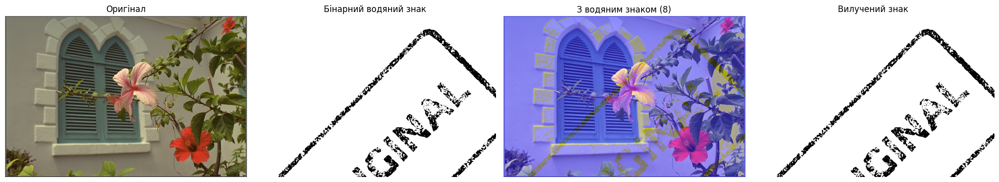

In [36]:
watermark = cv2.imread('data/wm1.png')
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2RGB)

BIT_PLANE = 8
threshold = 128
dark_as_one = False

gray_wm = cv2.cvtColor(watermark, cv2.COLOR_RGB2GRAY)

if dark_as_one:
    wm_bin = (gray_wm < threshold).astype(np.uint8)
else:
    wm_bin = (gray_wm >= threshold).astype(np.uint8)

h, w, _ = img.shape
wm_h, wm_w = wm_bin.shape

reps_h = int(np.ceil(h / wm_h))
reps_w = int(np.ceil(w / wm_w))

wm_tiled = np.tile(wm_bin, (reps_h, reps_w))
wm_prepared = wm_tiled[:h, :w].astype(np.uint8)

wm_binary_used = (wm_prepared * 255).astype(np.uint8) 

stego_img = img.copy()

mask = np.uint8(1 << (BIT_PLANE - 1))
clear_mask = np.uint8(255 ^ int(mask))

blue_channel = stego_img[..., 2]
blue_cleared = blue_channel & clear_mask
blue_with_wm = blue_cleared | (wm_prepared * mask)

stego_img[..., 2] = blue_with_wm


extracted_wm = ((stego_img[..., 2] & mask) > 0).astype(np.uint8) * 255

fig, axes = plt.subplots(1, 4, figsize=(20, 6))

axes[0].imshow(img)
axes[0].set_title("Оригінал")
axes[0].axis('off')

axes[1].imshow(wm_binary_used, cmap='gray')
axes[1].set_title("Бінарний водяний знак")
axes[1].axis('off')

axes[2].imshow(stego_img)
axes[2].set_title(f"З водяним знаком ({BIT_PLANE})")
axes[2].axis('off')

axes[3].imshow(extracted_wm, cmap='gray')
axes[3].set_title("Вилучений знак")
axes[3].axis('off')

plt.tight_layout()
plt.show()